In [1]:
import os
import time
import pickle

import pandas as pd
import numpy as np

import shapely
from shapely.geometry import Point, Polygon
from shapely import ops

import geopandas as gpd

import xarray as xr
import rioxarray as rxr
import rasterio as rio

import holoviews as hv
import holoviews.operation.datashader as hd
import bokeh as bk
from bokeh.plotting import figure, show
from bokeh.io import output_notebook
from holoviews.plotting.util import process_cmap

hv.extension('bokeh', logo=False)

import warnings
warnings.filterwarnings('ignore')

from whitebox.whitebox_tools import WhiteboxTools


output_notebook()

/home/danbot/Documents/code/data_analysis/lib/python3.8/site-packages/geopandas/_compat.py:111: UserWarning: The Shapely GEOS version (3.9.1-CAPI-1.14.2) is incompatible with the GEOS version PyGEOS was compiled with (3.10.1-CAPI-1.16.0). Conversions between both will be slow.
  warnings.warn(


Loading BokehJS ...

In [54]:
data_dir = '/media/danbot/Samsung_T5/geospatial_data/'
hysets_dir = os.path.join(data_dir, 'HYSETS_data/')
hydat_dir = os.path.join(data_dir, 'hydat_db/')
dem_dir = os.path.join(data_dir, 'DEM_data/')
processed_dem_dir = os.path.join(dem_dir, 'processed_dem/')
# dem_fpath_1km = os.path.join(dem_dir, 'watershed_group_tiles_merged_1km/')
# dem_fpath_10km = os.path.join(dem_dir, 'watershed_group_tiles_merged_10km/')

# root_path = '/home/danbot/Documents/code/thesis_code/validate_hysets/'
# updated basins from December 2021 (dave Hutchinson) have path formats like: 
# WSC_data/2021-12-basins/all/07AA001/basin/07AA001_DrainageBasin_BassinDeDrainage.shp
wsc_basin_dir = data_dir + 'WSC_data/2021-12-basins/all/'

# other data sources
glhymps_fpath = data_dir + 'GLHYMPS/GLHYMPS.gdb'

# snow and land use / land cover
nalcms_fpath = data_dir + 'NALCMS_NA_2010/NA_NALCMS_2010_v2_land_cover_30m/' + 'NA_NALCMS_2010_v2_land_cover_30m.tif'

# where to save results of validation
processed_data_output_path = '/media/danbot/T7 Touch/thesis_data/processed_stations/'
processed_polygons_out_path = '/home/danbot/Documents/code/hysets_validation/processed_data/derived_basins/'

# HYSETS validation

![Schematic of the HYSETS database](../images/hysets_schematic.png)

1. Generate a small random set of monitored location coordinates in BC. (from hysets)
2. Get basin polygons  
    i. from hysets, from wsc, from FWA
    ii. compare areas?
3. Retrieve stream accumulation network derived from 1as DEM  
    i. find closest point on derived network
    ii. derive basin, compare area to 2. i.
    iii. extract basin polygon
3. Generate a set of basin polygon tuples (derived from wsc, hysets, and my own feeble attempt)  
    i. the method used to generate basin polygons is important to be clear about  
        a. it will be used to generate basins and derive properties for unknown basins
4. Compile list of basin characteristics from HYSETS:  
    i. important! review and define how each is derived!  **!!lots of work here!!**
5. Compile sample of station location coordinates:  
    i. find closest coordinates to the stream accumulation network defined in 3.
    ii. derive basin polygon
    iii. mask the input layers used in HYSETS
    iv. compare results!

## 1. Generate random set of station coordinates

* Import station metadata from WSC to get basins in BC.
* Import the basin properties, station metadata from hysets.

In [3]:
wsc_df = pd.read_csv(hydat_dir + 'hydrometric_StationList_2021-07.csv')
wsc_df.columns = [e.strip() for e in wsc_df.columns]

wsc_bc = wsc_df[wsc_df['Prov/Terr'] == 'BC']
wsc_bc.columns = [e.strip() for e in wsc_bc.columns]
wsc_bc.columns

Index(['ID', 'Name / Nom', 'Latitude', 'Longitude', 'Prov/Terr',
       'Timezone / Fuseau horaire'],
      dtype='object')

In [4]:
# compile the list of stations with a basin polygon
wsc_stations = os.listdir(wsc_basin_dir)

In [34]:
# file containing derived watershed properties used in hysets
hysets_props_fname = 'HYSETS_watershed_properties.txt'
# import the set of derived watershed properties from hysets
hysets_props = pd.read_csv(hysets_dir + hysets_props_fname, delimiter=';')
# hysets_props = gpd.GeoDataFrame(hysets_props[[e for e in hysets_props if e != 'geometry']], geometry=hysets_props['geometry'].values, crs='EPSG:4326')

In [35]:
# create a dataframe of station locations from hysets
hy_geom = [shapely.geometry.Point(e['Centroid_Lon_deg_E'], e['Centroid_Lat_deg_N']) for _, e in hysets_props.iterrows()]
hysets_gdf = gpd.GeoDataFrame(hysets_props, 
                              geometry=hy_geom)
# convert to projected CRS NOTE--USE BC ALBERS: EPSG 3005
hysets_gdf = hysets_gdf.set_crs('EPSG:4326')
# hysets_gdf = hysets_gdf.to_crs('EPSG:3857')
hysets_gdf = hysets_gdf.to_crs('EPSG:3005')


In [36]:
hysets_basins = gpd.read_file(hysets_dir + 'HYSETS_watershed_boundaries.zip')
hysets_basins = hysets_basins.set_crs('EPSG:4326')
hysets_basins = hysets_basins.to_crs('EPSG:3005')
hysets_basins.head()

,features,Name,OfficialID,FlagPAVICS,Source,Area,geometry
0,1,SAINT JOHN RIVER AT FORT KENT,01AD002,0,HYDAT,14703.921076,"POLYGON ((4819492.441 1929197.747, 4819576.057..."
1,1,ST. FRANCIS RIVER AT OUTLET OF GLASIER LAKE,01AD003,0,HYDAT,1358.643465,"POLYGON ((4885390.291 1899321.978, 4885369.785..."
2,1,MADAWASKA (RIVIERE) A 6 KM EN AVAL DU BARRAGE ...,01AD015,1,HYDAT,2712.000000,"POLYGON ((4856232.643 1994877.811, 4857954.646..."
3,1,FISH RIVER NEAR FORT KENT,01AE001,0,HYDAT,2245.763823,"POLYGON ((4901614.812 1922193.642, 4901717.819..."
4,1,BLACK BROOK NEAR ST-ANDRE-DE-MADAWASKA,01AF006,0,HYDAT,14.200000,"POLYGON ((4958391.731 1956027.153, 4955643.104..."


In [8]:
def determine_pct_covered(stn, grp_polygon):
    this_basin = hysets_basins[hysets_basins['OfficialID'] == stn]
    intersection = this_basin.geometry.values[0].intersection(grp_polygon.geometry.values[0])
    return round((intersection.area / this_basin.geometry.area).values[0], 1)
    

In [9]:
def get_grp_polygon(grp_code):
    grp_polygon = gpd.read_file(nhn_group_polygon_path + fname)
    # grp_polygon = grp_polygon.
    grp_polygon = grp_polygon.to_crs(hysets_basins.crs)
    grp_polygon['grp'] = grp_code
    grp_polygon = grp_polygon.dissolve(by='grp', aggfunc='sum')
    return grp_polygon

In [10]:
[e for e in wsc_stations if e=='08CA002'] 

[]

In [62]:
nhn_group_polygon_path = '/home/danbot/Documents/code/hysets_validation/processed_data/merged_basin_groups/final_polygons/'

# create a dict to organize stations by their location in the regional groupings
region_dict = {}
regional_group_polygon_fnames = os.listdir(nhn_group_polygon_path)
code_dict = {}
for fname in regional_group_polygon_fnames:
    grp_code = fname.split('_')[0]
    print(f'  Finding HYSETS stations within {grp_code}.')
    grp_polygon = get_grp_polygon(grp_code)
    # intersecting_basins = gpd.sjoin(hysets_basins, grp_polygon, how='inner', predicate='covered_by')
    intersecting_basins = gpd.sjoin(hysets_basins, grp_polygon, how='inner', predicate='intersects')
    station_IDs = list(intersecting_basins['OfficialID'].values)
    region_dict[grp_code] = station_IDs
    # stations must also be in wsc basin list
    station_IDs = [e for e in station_IDs if e in wsc_stations]
    for stn in station_IDs:
        this_basin = intersecting_basins[intersecting_basins['OfficialID'] == stn]
        intersection = this_basin.geometry.values[0].intersection(grp_polygon.geometry.values[0])
        coverage = determine_pct_covered(stn, grp_polygon)
        if coverage > 0.01:
            if stn not in code_dict.keys():
                code_dict[stn] = grp_code
                # print(f'{coverage} of {stn} is within {grp_code}.')
            else:
                other_grp_polygon = get_grp_polygon(code_dict[stn])
                other_grp_coverage = determine_pct_covered(stn, other_grp_polygon)
                if coverage > other_grp_coverage:
                    code_dict[stn] = grp_code
                    # print(f'   {coverage:.1f} of {stn} is covered by {grp_code} > {code_dict[stn]} @ ({other_grp_coverage:.1f}).') 
            


  Finding HYSETS stations within 08C.
  Finding HYSETS stations within 08F.
  Finding HYSETS stations within 08G.
  Finding HYSETS stations within Liard.
  Finding HYSETS stations within 08N.
  Finding HYSETS stations within 07U.
  Finding HYSETS stations within 08H.
  Finding HYSETS stations within 08B.
  Finding HYSETS stations within 08P.
  Finding HYSETS stations within 07O.
  Finding HYSETS stations within 08E.
  Finding HYSETS stations within 08O.
  Finding HYSETS stations within Peace.
  Finding HYSETS stations within 09A.
  Finding HYSETS stations within 07G.
  Finding HYSETS stations within 08A.
  Finding HYSETS stations within Fraser.
  Finding HYSETS stations within 08D.


In [10]:
# with open('20220211_code_dict.pickle', 'wb') as handle:
#     pickle.dump(code_dict, handle, protocol=pickle.HIGHEST_PROTOCOL)

with open('20220211_code_dict.pickle', 'rb') as handle:
    code_dict = pickle.load(handle)

In [11]:
# find stations in common between HYSETS and WSC within the study region
all_stations = list(code_dict.keys())
print(f'There are {len(all_stations)} in HYSETS falling within the study region')
common_stations = [stn for stn in all_stations if stn in wsc_stations]
print(f'   and {len(common_stations)} of these are also in common with the WSC polygon set.')

There are 643 in HYSETS falling within the study region
   and 643 of these are also in common with the WSC polygon set.


In [12]:
# import BC border polygon
bc_border_file = data_dir + 'WSC_data/BC_border/BC_PROV_BOUNDARIES_LINES_500M.geojson'
bc_border_lines = gpd.read_file(bc_border_file)
bc_border_crs = bc_border_lines.crs
bc_border_polygon = Polygon(shapely.ops.linemerge(bc_border_lines.geometry.values))
bc_border = gpd.GeoDataFrame(geometry=[bc_border_polygon], crs=bc_border_crs)
bc_border = bc_border.to_crs(3005)

## Retrieve basin polygon corresponding to the sample location set

i. Retrieve the polygon from hysets dataset  
ii. Retrieve the polygon from WSC dataset  
iii. Use the location coordinates to derive the basin polygon using 1 arcsecond DEM and WhiteBoxTools  

In [15]:
# mapped_group_tiles.head()
# # mapped_group_tiles = mapped_group_tiles.to_crs('EPSG:3005')
# hv_tiles = hv.element.tiles.OSM().opts(width=1100, height=700, alpha=0.5)
# hv_grp_polygons = hv.Polygons(mapped_group_tiles.geometry).opts(alpha=0.4)
# hv_tiles * hv_grp_polygons

In [16]:
wbt = WhiteboxTools()

cwd = os.getcwd()
wbt.verbose = False
wbt.set_working_dir(cwd)

In [51]:
def ensure_dir(file_path):
    directory = os.path.dirname(file_path)
    if not os.path.exists(directory):
        os.makedirs(directory)

def wb_callback(msg):
    print(msg)
    
def get_nearest_point(stn, grp_code, loc, resolution):
    
    fpath = processed_dem_dir + f'{grp_code}_STREAMS_D8_FILL_3005_{resolution}.tif'
    flow_acc = rxr.open_rasterio(fpath, masked=True)
    
    # convert to BC albers for distance calc
    acc = flow_acc.rio.reproject('EPSG:3005')
    temp_loc = loc.to_crs(3005)

    # calculate distances from station to flow accumulation points
    dists = np.sqrt((temp_loc.geometry.x.values[0]-acc.x)**2 + (temp_loc.geometry.y.values[0]-acc.y)**2)
    
    acc.name = 'stream'
    dists.name = 'distances'
    ds = xr.merge([dists, acc])
    
    stream = ds.where(~np.isnan(ds.stream))
    
    min_dist = stream.distances.min().item()
    
    # print(f'   min distance = {min_dist:.0f}m')

    dists = stream.where(stream.distances == min_dist, drop=True)
    
    if dists.distances.size == 0:        
        print('   ')
        print('   ')
        raise Exception('No minimum point found')
    else:
        return Point(dists.x, dists.y), dists.rio.crs
    
def set_snapped_point(stn, snap_point_path, grp_code, stn_loc, resolution):
    if os.path.exists(snap_point_path):
        gdf = gpd.read_file(snap_point_path)
        crs = gdf.crs
        # print(f'    snap point path exists, crs={crs}')
    else:
        pt, crs = get_nearest_point(stn, grp_code, stn_loc, resolution)
        gdf = gpd.GeoDataFrame(geometry=[pt], crs=crs)
        print(f'    new snap point created.  crs={crs}')
        gdf.to_file(snap_point_path)
        
    return gdf
    

In [56]:
def derive_watershed_raster(stn, resolution='low'):
    t0 = time.time()
    hysets_basin_info = hysets_basins[hysets_basins['OfficialID'] == stn].copy()
    hysets_stn_properties = hysets_gdf[hysets_gdf['Official_ID'] == stn].copy()
    if (hysets_stn_properties.empty | hysets_basin_info.empty):
        print(f'   {stn} does not exist in HYSETS.')
        return None
    
    hysets_basin_da = hysets_basin_info['Area'].values[0]    
    hysets_stn_properties = hysets_stn_properties.to_crs(3005)
    hysets_stn_loc = hysets_stn_properties.geometry.values[0]
    
    # WSC_data/2021-12-basins/all/07AA001/basin/07AA001_DrainageBasin_BassinDeDrainage.shp
    wsc_basin_fpath = wsc_basin_dir + f'{stn}/basin/'
    wsc_basin = gpd.read_file(wsc_basin_fpath)
    wsc_basin = wsc_basin.to_crs(3005)
    new_wsc_basin_area = wsc_basin.geometry.area.values[0] / 1E6
    assert wsc_basin.crs == hysets_basin_info.geometry.crs
    
    wsc_stn_loc_fpath = wsc_basin_dir + f'{stn}/pour_point/'
    wsc_stn_loc = gpd.read_file(wsc_stn_loc_fpath)
    wsc_stn_loc = wsc_stn_loc.to_crs(3005)
    
    
    grp_code = code_dict[stn]
    
    loc_distance = wsc_stn_loc.geometry.distance(hysets_stn_loc).values[0] / 1E3
        
    info_string = f'{stn}: bound by {grp_code}: WSC DA = {new_wsc_basin_area:.1f}km^2, HYSETS DA= {hysets_basin_da:.1f}km^2.'
    info_string += f'  {loc_distance:.1f}km btwn. reported locations.'
    
    # make sure processed data folder exists
    ensure_dir(processed_data_output_path + f'{stn}/')
    
    # dem, d8 flow direction, and pour point paths
    dem_path = processed_dem_dir + f'{grp_code}_DEM_3005_{resolution}.tif'
    d8_pointer_path = processed_dem_dir + f'{grp_code}_DIR_3005_{resolution}.tif'
    xarray_snapped_pp_fpath = processed_data_output_path + f'{stn}/{stn}_xarraysnapped_pour_point.shp'

    # output filename
    basin_out_path = processed_data_output_path + f'{stn}/{stn}_basin_derived_{resolution}.tif'
        
    # need to define a pour point in order for wbt to derive watershed
    set_snapped_point(stn, xarray_snapped_pp_fpath, grp_code, wsc_stn_loc, resolution)
        
    assert os.path.exists(dem_path)
    assert os.path.exists(d8_pointer_path)
    assert os.path.exists(xarray_snapped_pp_fpath)

    if not os.path.exists(basin_out_path):
        # print(f'   ... delineating basin for {stn}')
        wbt.watershed(
            d8_pntr=d8_pointer_path, 
            pour_pts=xarray_snapped_pp_fpath, 
            output=basin_out_path, 
            esri_pntr=False, 
        )        
        
    t1 = time.time()
    # print(f'   processed {stn} in {t1-t0:.1f}s')
    return basin_out_path


In [63]:
processed_polygons_out_path
processed_data_output_path

'/media/danbot/T7 Touch/thesis_data/processed_stations/'

In [64]:
def retrieve_raster(fpath):
    rds = rxr.open_rasterio(fpath)
    crs = rds.rio.crs
    affine = rds.rio.transform(recalc=False)
    return rds, crs, affine


def watershed_raster_to_polygon(stn, resolution):
    fpath = processed_data_output_path + f'{stn}/{stn}_basin_derived_{resolution}.tif'
    if not os.path.exists(fpath):
        path = derive_watershed_raster(stn, resolution)
    else:
        rds, crs, affine = retrieve_raster(fpath)
    mask = rds.data == 1    
    results = rio.features.shapes(rds.data, mask=mask, transform=affine)

    geoms = [shapely.geometry.shape(shp) for shp, value in list(results)]
    
    gdf = gpd.GeoDataFrame(geometry=geoms, crs=crs)
    if len(gdf) > 1:
        print('too many shapes output!')
        assert 0 == 1
        # catchment_polygon = ops.unary_union(polygons)
        
    basin_area = gdf.geometry.area / 1E6
    # gdf = gpd.GeoDataFrame(geometry=[basin_polygon], crs=crs)
    gdf['area'] = basin_area

    return gdf


In [21]:
def get_stream_network(stn, mask=False):
    grp_code = stn_data_mapping_dict[stn]['code']
    basin_data = rxr.open_rasterio(dem_fpath_1km + f'{grp_code}_streams.tif')
    # print(basin_data.rio.crs)
    if mask:                        
        gdf = get_or_derive_shape_polygon(stn)
        basin_data = basin_data.rio.clip(gdf.geometry, gdf.crs)
    return basin_data


def get_hysets_polygon(stn):
    return hysets_basins[hysets_basins['OfficialID'] == stn].geometry

In [50]:
def get_overlay_network_and_basin_plot(stn):

    hv_tiles = hv.element.tiles.OSM().opts(width=1100, height=700, alpha=0.5)
    
    # derived basin
    basin_polygon = get_or_derive_basin_polygon(stn)
    # print('derived basin crs before area calc: ', basin_polygon.crs)
    basin_area_polygon = basin_polygon.to_crs('EPSG:3005')
    basin_area = basin_area_polygon.geometry.area.values[0] / 1E6
    
    # reported station loc
    loc = stn_data[stn]['loc']
    
    # WSC polygon
    
    # wsc_name = wsc_df[wsc_df['ID'] == stn]['Name / Nom'].values[0]
    # print(wsc_name)
    # print(wsc_basins[wsc_basins['SOURCE_NAME'] == 'CAMP CREEK'])
    # wsc_basin =  wsc_basins[wsc_basins['SOURCE_NAME'] == 'MACKAY CREEK']
    # wsc_basin =  wsc_basins[wsc_basins['SOURCE_NAME'] == 'CAMP CREEK']
    # wsc_basin =  wsc_basins[wsc_basins['SOURCE_NAME'] == 'GREATA CREEK']
    # print(wsc_basin)
#     wsc_basin_area = wsc_basin.to_crs(3005)
#     wsc_area = wsc_basin_area.area.values[0]/1E6    
    
    # hysets polygon
    hysets_basin = get_hysets_polygon(stn)
    # print('hysets basin crs before area calc: ', hysets_basin.crs)
    hysets_area_basin = hysets_basin.to_crs('EPSG:3005')
    hysets_area = hysets_area_basin.area.values[0] / 1E6
        
    fig_title = f'{stn}: derived={basin_area:.2f} km² (blue) - hysets={hysets_area:.2f} km² (orange)'
    print(fig_title)
    # transform for plotting
    hy_basin = hysets_basin.to_crs('EPSG:3857')
    # print('hy basin polygon crs ', hy_basin.crs)
    dr_basin = basin_polygon.to_crs('EPSG:3857')
    
    hv_hy_basin = hv.Polygons(hy_basin.geometry).opts(title=fig_title, alpha=0.3, color='orange')
    hv_dr_basin = hv.Polygons(dr_basin.geometry).opts(alpha=0.3, color='blue')
    # hv_wsc_basin = hv.Polygons(wsc_basin.geometry).opts(alpha=0.3, color='green')
    
    # pour point as derived from nearest flow accumulation point
    snapped_point = set_snapped_point(stn, loc).to_crs('EPSG:3857')
    hv_snapped_point = hv.Points(snapped_point).opts(size=10, color='blue')
    
    # station locations as reported
    reported_locs = stn_data[stn]['loc'].to_crs('EPSG:3857') 
    hv_reported_loc = hv.Points(reported_locs).opts(size=10, color='red')
    
    hysets_stn_loc = hysets_gdf[hysets_gdf['Official_ID'] == stn].to_crs(3857)
    hysets_area_diff = abs(hysets_stn_loc['Drainage_Area_GSIM_km2'] - hysets_stn_loc['Drainage_Area_km2']) / hysets_stn_loc['Drainage_Area_km2']
    if hysets_area_diff.values[0] > 0.05:
        print(f'Reported hysets area values have >5% difference ({hysets_area_diff.values[0]:.1f}h).')
    hv_hysets_stn = hv.Points(hysets_stn_loc.geometry).opts(color='orange', size=10, marker='triangle')
        
    stream_network = get_stream_network(stn, True)
    hv_stream_network = hv.Image(stream_network, kdims=['x', 'y'],
                        ).opts(alpha=0.9, width=900, height=600)

    glhymps = process_glhymps(stn, hy_basin, glhymps_fpath)
    gl_dat = glhymps[['Porosity', 'geometry']]
    hv_glhymps = hv.Polygons(gl_dat, vdims=['Porosity']).opts(alpha=0.5, tools=['hover'])
    
    lulc = open_and_clip_raster(hy_basin, nalcms_fpath)
    lulc = lulc.rio.reproject('EPSG:3857')

    hv_lulc = hv.Image(lulc, kdims=['x', 'y']).opts(alpha=0.5, tools=['hover'])
    
    # basin_layout = hv_tiles * hv_watershed * hv_hysets_basin * hv_stream_network * hv_snapped_point * hv_points * hv_hysets_stn
    glhymps_layout = hv_tiles * hv_hy_basin * hv_glhymps * hv_snapped_point * hv_hysets_stn * hv_hysets_stn
    nalcms_layout = hv_tiles * hv_hy_basin * hv_lulc * hv_snapped_point * hv_hysets_stn
    layout = hv_tiles * hv_hy_basin * hv_dr_basin * hv_stream_network * hv_hysets_stn * hv_snapped_point
    return layout

In [25]:
import datashader as dsh
from datashader import transfer_functions as tf 
from datashader import utils
from colorcet import palette

from holoviews import opts
from holoviews.operation.datashader import datashade, shade, dynspread, spread, rasterize
from holoviews.operation import decimate


decimate.max_samples=1000
dynspread.max_px=20
dynspread.threshold=0.5

In [26]:
test_code = '08H'
resolution = 'hi'
cwd = '/home/danbot/Documents/code/hysets_validation/validate_hysets/'

In [27]:
from scipy import stats

# stats.mode(basin.data)

In [28]:
basin = rxr.open_rasterio(processed_dem_dir + f'{test_code}_WBT_ACC_D8_FILL_3005_{resolution}.tif') 
# basin = basin.where(basin < 0, np.nan)
nodata_val = basin.rio.nodata
basin = basin.where(basin != nodata_val, drop=True)
scale_x, scale_y = 0.05, 0.05

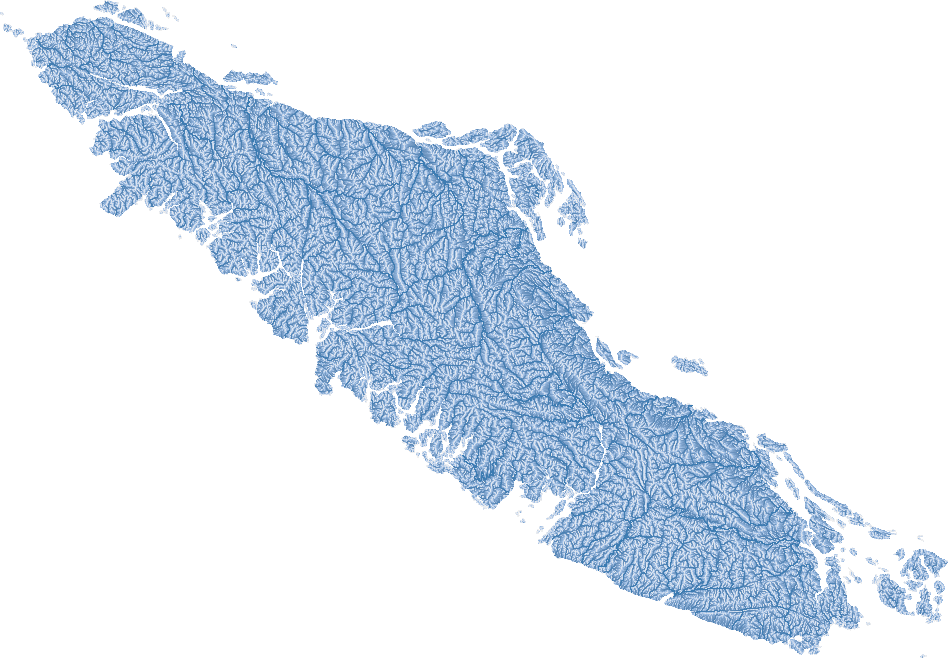

In [29]:
ys, xs = int(basin.shape[1]*scale_x), int(basin.shape[2]*scale_y)
agg =  dsh.Canvas(plot_width=xs, plot_height=ys).raster(basin[0], 
                    downsample_method='mean')

cmap = palette['blues']#['kgy']
bg_col='white'
img = tf.shade(agg, cmap=cmap)
img = tf.set_background(img, bg_col)
utils.export_image(img=img, filename=cwd + 'lai2', fmt=".png",
                     background=None)

In [30]:
hv_stream_network = hv.Image(agg).opts(alpha=0.9, width=900, height=600, colorbar=True)
hv_stream_network

:Image   [x,y]   (z)

## Compile the set of basin attributes derived in HYSETS for validation

Basin characteristics derived or collected in hysets are as follows, in order of columns as they appear in the watershed properties csv (excluding columns associated with flags):

### Physiography

1. **Basin Area**: (*$km^2$*) for BC, drainage areas correspond to the official values reported by the governing agency.  In BC, the basins are accessible from the WSC basin polygon repository accessible [here](https://donnees.ec.gc.ca/data/water/products/national-hydrometric-network-basin-polygons/?lang=en). Where catchmenet polygons are not available, watershed contours were taken from the Global Streamflow Indices and Metadata (GSIM) project.  A `Drainage_Area_GSIM_km2` boolean parameter indicates if this value is used in the absence of a WSC-derived value, or if the value diverges significantly from the value reported by WSC.  For catchments $<= 50 km^2$, `flag_artificial_bounds` boolean variable indicates that catchment delineation was approximate.  Especially at higher latitudes, the DEM available for deriving basins has increased in resolution, and here we use 1 arcsecond DEM (roughly 30-40 m resolution, varying by latitude over BC).  

2. **mean watershed elevation**:  (*meters above sea level*)  
3. **slope**: (*degrees*) average slope when considering individual elevation differences between tiles  
4. **gravelius**: (*-*) ratio of perimeter to the perimeter of a circle of the same area  
5. **perimeter**: (*meters*)  
6. **aspect**: (*degrees*) main orientation of the catchment, i.e. direction the average slope points   

### Land Use (all expressed as a fraction /100)

[Source files downloaded](http://www.cec.org/north-american-environmental-atlas/land-cover-2010-landsat-30m/) from the Commission for Environmental Cooperation (CEC).  Nineteen "Level III" land cover classes were condensed into eight (hysets reports seven?).  

7. Forest
8. Grass
9. Wetland
10. Water
11. Urban
12. Shrubs
13. Crops
14. Snow & Ice

The NACLMS raster has a single band with 19 integers representing different land types:

| Value | Description | RGB | HYSETS Cat. (above) |
|---|---|---|---|
| 1 | Temperate or sub-polar needleleaf forest | RGB 0 61 0 | 7 |
| 2 | Sub-polar taiga needleleaf forest | RGB 148 156 112 | 7 |
| 3 | Tropical or sub-tropical broadleaf evergreen forest | RGB 0 99 0 | 7 |
| 4 | Tropical or sub-tropical broadleaf deciduous forest | RGB 30 171 5 | 7 |
| 5 | Temperate or sub-polar broadleaf deciduous forest | RGB 20 140 61 | 7 |
| 6 | Mixed forest | RGB 92 117 43 | 7 |
| 7 | Tropical or sub-tropical shrubland | RGB 179 158 43 | 12 |
| 8 | Temperate or sub-polar shrubland | RGB 179 138 51 | 12 |
| 9 | Tropical or sub-tropical grassland | RGB 232 220 94 | 8 |
| 10 | Temperate or sub-polar grassland | RGB 225 207 138 | 8 |
| 11 | Sub-polar or polar shrubland-lichen-moss | RGB 156 117 84 | 12 |
| 12 | Sub-polar or polar grassland-lichen-moss | RGB 186 212 143 | 8 |
| 13 | Sub-polar or polar barren-lichen-moss | RGB 64 138 112 | **8** needs verification |
| 14 | Wetland | RGB 107 163 138 | 9 |
| 15 | Cropland | RGB 230 174 102 | 13 |
| 16 | Barren lands | RGB 168 171 174 | **11** needs verification |
| 17 | Urban | RGB 220 33 38 | 11 |
| 18 | Water | RGB 76 112 163 | 10 |
| 19 |  Snow and Ice | RGB 255 250 255 | 14 |


### Geology

15. Permeability (logk / $m^2$): geometric mean
16. Porosity: arithmetic mean based on Thiessen polygon




### Meteorology

Precipitation data are in (mm/d), temperature in Celsius.

1.  **Snow Water Equivalent**: two datasets:
    i. 2010-2018 at roughly 1km resolution ([SNODAS](https://nsidc.org/data/g02158)) (only up to ~54 degrees... not much use for most of where it snows)  
    ii. ERA5-land reanalysis (1981-2018) covers glope.

In [97]:
import richdem as rd

In [109]:
def calculate_gravelius_and_perim(polygon):
    # assert polygon.crs == 'EPSG:3005'
    p = polygon.to_crs('EPSG:3005')
    perimeter = p.geometry.length.values[0]
    gravelius = 4 * np.pi / perimeter
    return gravelius, perimeter


def open_and_clip_raster(basin_polygon, dem_path):
    # open dem and mask using basin polygon
    xds = rxr.open_rasterio(dem_path, masked=True)
    
    crs = xds.rio.crs.to_epsg()
    if not crs:
        crs = xds.rio.crs.to_wkt()

    # xds = xds.rio.reproject('EPSG:3005')
    basin_polygon = basin_polygon.to_crs(crs)
    bounds = tuple(basin_polygon.bounds.values[0])
    subset_raster = xds.rio.clip_box(*bounds)
    return subset_raster.rio.clip(basin_polygon.geometry, basin_polygon.crs)

    
def clip_and_process_raster_stats(stn, basin_polygon, dem_path):
    basin_data = open_and_clip_raster(basin_polygon, dem_path)
    # evaluate masked raster data
    vals = basin_data.data.flatten()    
    mean_val, min_val, max_val = np.nanmean(vals), np.nanmin(vals), np.nanmax(vals)
    return mean_val, min_val, max_val


def recategorize_lulc(data):    
    forest = ('Land_Use_Forest_frac', [1, 2, 3, 4, 5, 6])
    shrub = ('Land_Use_Shrubs_frac', [7, 8, 11])
    grass = ('Land_Use_Grass_frac', [9, 10, 12, 13])
    wetland = ('Land_Use_Wetland_frac', [14])
    crop = ('Land_Use_Crops_frac', [15])
    urban = ('Land_Use_Urban_frac', [16, 17])
    water = ('Land_Use_Water_frac', [18])
    snow_ice = ('Land_Use_Snow_Ice_frac', [19])
    lulc_dict = {}
    for label, p in [forest, shrub, grass, wetland, crop, urban, water, snow_ice]:
        prop_vals = round(sum([data[e] if e in data.keys() else 0 for e in p]), 2)
        lulc_dict[label] = prop_vals
    return lulc_dict


def get_value_proportions(data):
    # vals = data.data.flatten()
    all_vals = data.data.flatten()
    vals = all_vals[~np.isnan(all_vals)]
    n_pts = len(vals)
    unique, counts = np.unique(vals, return_counts=True)

    # create a dictionary of land cover values by coverage proportion
    prop_dict = {k: v/n_pts for k, v in zip(unique, counts)}
    prop_dict = recategorize_lulc(prop_dict)
    return prop_dict      


def check_lulc_sum(stn, data):
    checksum = sum(list(data.values())) 
    if abs(1-checksum) >= 0.02:
        print(f'   ...{stn} failed checksum: {checksum}')        


def process_lulc(stn, basin_polygon, nalcms_fpath):
    clipped_raster = open_and_clip_raster(basin_polygon, nalcms_fpath)
    # checksum verifies proportions sum to 1
    prop_dict = get_value_proportions(clipped_raster)
    check_lulc_sum(stn, prop_dict)
    return pd.DataFrame(prop_dict, index=[stn])

In [107]:
def get_perm_and_porosity(merged):
    merged['area_frac'] = merged['Shape_Area'] / merged['Shape_Area'].sum()
    weighted_permeability = round((merged['area_frac'] * merged['Permeability_no_permafrost']).sum(), 2)
    weighted_porosity = round((merged['area_frac'] * merged['Porosity']).sum(), 2)
    return weighted_permeability, weighted_porosity
    

def process_glhymps(stn, polygon, fpath):
    # pulled from checking the crs proj4 string using fiona
    # not sure what the equivalent EPSG code is...
    proj = 'proj=cea +lat_ts=0 +lon_0=0 +x_0=0 +y_0=0 +datum=WGS84 +units=m +no_defs'
    # convert  polygon crs to match GLHYMPS
    poly = polygon.to_crs(proj)
    gdf = gpd.read_file(fpath, mask=poly)
    
    # convert back to 3857 for plotting
    poly_gdf = gpd.GeoDataFrame(poly, geometry=[poly.geometry.values[0]], crs=proj)
    # glhymps_gdf = glhymps_gdf.to_crs('EPSG:3857')
    merged = gpd.overlay(gdf, poly_gdf, how='intersection')
    merged = merged.to_crs('EPSG:3857')
    return merged

In [193]:
def calculate_slope_and_aspect(stn, basin_polygon, resolution):   
    grp_code = code_dict[stn]
    dem_path =  processed_dem_dir + f'{grp_code}_DEM_3005_{resolution}.tif'
    
    
    clipped_raster = open_and_clip_raster(basin_polygon, dem_path)
    wkt = clipped_raster.rio.crs.to_wkt()
    affine = clipped_raster.rio.transform()
    
    rdem_clipped = rd.rdarray(
        clipped_raster.data[0], 
        no_data=clipped_raster.rio.nodata, 
        # projection=wkt, 
    )
    rdem_clipped.geotransform = affine.to_gdal()
    rdem_clipped.projection = wkt
    slope = np.nanmean(rd.TerrainAttribute(rdem_clipped, attrib='slope_degrees'))
    aspect = np.nanmean(rd.TerrainAttribute(rdem_clipped, attrib='aspect'))
    return slope, aspect
#     aspect_out_path = processed_data_output_path + f'{stn}/{station_ID}_aspect_{resolution}.tif'
#     slope_out_path = processed_data_output_path + f'{stn}/{station_ID}_slope_{resolution}.tif'
       
#     if not os.path.exists(aspect_out_path):
#         wbt.aspect(
#             dem_path, 
#             aspect_out_path, 
#             zfactor=None, 
#             callback=wb_callback(f'   ...saved watershed to {aspect_out_path}')
#         )
    
#     if not os.path.exists(slope_out_path):
#         wbt.slope(
#             dem_path, 
#             slope_out_path, 
#             zfactor=None, 
#             units="degrees", 
#             callback=wb_callback(f'   ...saved watershed to {slope_out_path}')
#         )
        

In [232]:
def process_basin_characteristics(stations, basin_polygon_source, target_resolution):
    data = {}
    all_data = []
    for station in stations:
        print(f'  Starting validation of {station}.')
        grp_code = code_dict[station]
        data['station'] = station
        data['group_code'] = grp_code
        dem_path = processed_dem_dir + f'{grp_code}_DEM_3005_{target_resolution}.tif'
        basin_polygon_path = processed_polygons_out_path + f'{station}_basin_{target_resolution}.geojson'
        if not os.path.exists(basin_polygon_path):
            basin_polygon = watershed_raster_to_polygon(station, target_resolution)
        else:
            basin_polygon = gpd.read_file(basin_polygon_path, driver='GeoJSON')
            
        assert basin_polygon.crs == 'epsg:3005'
        data['Drainage_Area_km2'] = basin_polygon.geometry.area
        
        mean_el, min_el, max_el = clip_and_process_raster_stats(station, basin_polygon, dem_path)
        data['Elevation_m'] = mean_el
        data['min_el'] = min_el
        data['max_el'] = max_el
        
        gravelius, perimeter = calculate_gravelius_and_perim(basin_polygon)
        data['Perimeter'] = perimeter
        data['Gravelius'] = gravelius
            
        slope, aspect = calculate_slope_and_aspect(station, basin_polygon, target_resolution)
        data['Slope_deg'] = slope
        data['Aspect_deg'] = aspect
        
        glhymps_df = process_glhymps(station, basin_polygon, glhymps_fpath)
        weighted_permeability, weighted_porosity = get_perm_and_porosity(glhymps_df)
        data['Permeability_logk_m2'] = weighted_permeability
        data['Porosity_frac'] = weighted_porosity
        
        lulc_df = process_lulc(station, basin_polygon, nalcms_fpath)
        lulc_data = lulc_df.to_dict('records')[0]
        data.update(lulc_data)
        df = pd.DataFrame(data)
        all_data.append(df)
    results = pd.concat(all_data, axis=0, ignore_index=True)
    print(results)
        

In [ ]:
# resolution of the source dem
resolution = 'low'
basin_polygon_source = 'manual'# hysets' # or 'manual'
basin_characteristics = process_basin_characteristics(all_stations, basin_polygon_source, resolution)
basin_characteristics.to_csv(root_path + f'{basin_polygon_source}_basin_characteristics_{resolution}res.csv')

  Starting validation of 08CA001.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.0188623====================== ] (99% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.0208046====================== ] (99% - 0.0s - 1 threads)


  Starting validation of 08CA003.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.0143384====================== ] (99% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.0155502====================== ] (99% - 0.0s - 1 threads)


  Starting validation of 08CB002.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.0101524====================== ] (99% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.0112736====================== ] (99% - 0.0s - 1 threads)


  Starting validation of 08CC001.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.0190859====================== ] (99% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.022259======================= ] (99% - 0.0s - 1 threads)


  Starting validation of 08CC002.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.00068322===================== ] (98% - 0.0s - 1 threads)================================      ] (88% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.000751392==================== ] (98% - 0.0s - 1 threads)


  Starting validation of 08CC003.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.000394294==================== ] (98% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.000459423==================== ] (98% - 0.0s - 1 threads)======                  ] (65% - 0.0s - 1 threads)


  Starting validation of 08CD001.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.0234599====================== ] (99% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.0294138====================== ] (99% - 0.0s - 1 threads)


  Starting validation of 08CF001.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.25806======================== ] (99% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.292411======================= ] (99% - 0.0s - 1 threads)


  Starting validation of 08CG004.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.0474373====================== ] (99% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.054888======================= ] (99% - 0.0s - 1 threads)


  Starting validation of 08CG005.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.0062953====================== ] (99% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.00677807===================== ] (99% - 0.0s - 1 threads)


  Starting validation of 08FA004.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

t Wall-time = 0.000510653==================   ] (94% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

t Wall-time = 0.000128452==================   ] (94% - 0.0s - 1 threads)


  Starting validation of 08FA009.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

t Wall-time = 0.000190181==================   ] (95% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

t Wall-time = 0.000193093==================   ] (95% - 0.0s - 1 threads)


  Starting validation of 08FB004.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.00134165===================== ] (99% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.0014264====================== ] (99% - 0.0s - 1 threads)


  Starting validation of 08FB005.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.00191987===================== ] (99% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.00209275===================== ] (99% - 0.0s - 1 threads)


  Starting validation of 08FC002.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.00312788===================== ] (99% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.00389404===================== ] (99% - 0.0s - 1 threads)


  Starting validation of 08FC003.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.0169563====================== ] (99% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.0227909====================== ] (99% - 0.0s - 1 threads)


  Starting validation of 08FC005.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.000273202===================  ] (96% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.000317675===================  ] (96% - 0.0s - 1 threads)


  Starting validation of 08FE003.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

t Wall-time = 0.000138592==================   ] (94% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

t Wall-time = 0.00013636===================   ] (94% - 0.0s - 1 threads)


  Starting validation of 08FF001.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.00934667===================== ] (99% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.010435======================= ] (99% - 0.0s - 1 threads)


  Starting validation of 08FF002.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.0020843====================== ] (99% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.00231897===================== ] (99% - 0.0s - 1 threads)


  Starting validation of 08FF003.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

t Wall-time = 0.00135121===================== ] (99% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

t Wall-time = 0.00146202===================== ] (99% - 0.0s - 1 threads)reads)


  Starting validation of 08FF005.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

t Wall-time = 0.00045142===================== ] (98% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

t Wall-time = 0.000463733==================== ] (98% - 0.0s - 1 threads)


  Starting validation of 08FF006.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

t Wall-time = 0.000347894===================  ] (97% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

t Wall-time = 0.000310325===================  ] (97% - 0.0s - 1 threads)         ] (75% - 0.0s - 1 threads)


  Starting validation of 08GA027.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.000729013==================== ] (98% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.000701548==================== ] (98% - 0.0s - 1 threads)   ] (32% - 0.0s - 1 threads)


  Starting validation of 08GA037.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.000632297==================== ] (98% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.000717523==================== ] (98% - 0.0s - 1 threads)   ] (35% - 0.0s - 1 threads)


  Starting validation of 08GA038.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.000321329===================  ] (97% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.000327695===================  ] (97% - 0.0s - 1 threads)


  Starting validation of 08GA041.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.0048592====================== ] (99% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.0054721====================== ] (99% - 0.0s - 1 threads)


  Starting validation of 08GA049.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 8.0571e-05=================     ] (91% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 8.0362e-05=================     ] (91% - 0.0s - 1 threads)


  Starting validation of 08GA052.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.000144982==================   ] (95% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.000157148==================   ] (95% - 0.0s - 1 threads)


  Starting validation of 08GA054.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.00198072===================== ] (99% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.0021333====================== ] (99% - 0.0s - 1 threads)


  Starting validation of 08GA056.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.000164937==================   ] (95% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.000166696==================   ] (95% - 0.0s - 1 threads)


  Starting validation of 08GA057.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.00065191===================== ] (98% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.000709217==================== ] (98% - 0.0s - 1 threads)=========   ] (95% - 0.0s - 1 threads)


  Starting validation of 08GA061.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 6.4029e-05=================     ] (90% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 6.2969e-05=================     ] (90% - 0.0s - 1 threads)


  Starting validation of 08GA062.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.000231098===================  ] (96% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.00024046====================  ] (96% - 0.0s - 1 threads)


  Starting validation of 08GA064.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.000773292==================== ] (99% - 0.0s - 1 threads)=====================             ] (75% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.00079676===================== ] (99% - 0.0s - 1 threads)


  Starting validation of 08GA065.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.00011991===================   ] (94% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.00011918===================   ] (94% - 0.0s - 1 threads))


  Starting validation of 08GA067.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.000552497==================== ] (98% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.000570576==================== ] (98% - 0.0s - 1 threads)===========                        ] (53% - 0.0s - 1 threads)


  Starting validation of 08GA071.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.00615911===================== ] (99% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.00731479===================== ] (99% - 0.0s - 1 threads)


  Starting validation of 08GA072.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.00202406===================== ] (99% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.0021706====================== ] (99% - 0.0s - 1 threads)


  Starting validation of 08GA075.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.00198768===================== ] (99% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.00221108===================== ] (99% - 0.0s - 1 threads)


  Starting validation of 08GA077.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 7.2261e-05=================     ] (90% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 7.0344e-05=================     ] (90% - 0.0s - 1 threads)


  Starting validation of 08GA079.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.00101037===================== ] (99% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
[===============================================   ] (94% - 0.0s - 1 threads)

  Starting validation of 08GB009.


t Wall-time = 0.0010715====================== ] (99% - 0.0s - 1 threads)

A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.000430468==================== ] (98% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.000497911==================== ] (98% - 0.0s - 1 threads)


  Starting validation of 08GB013.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.00119575===================== ] (99% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.00132323===================== ] (99% - 0.0s - 1 threads)0s - 1 threads)


  Starting validation of 08GC008.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.00118143===================== ] (99% - 0.0s - 1 threads)=====================             ] (75% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.00123713===================== ] (99% - 0.0s - 1 threads)


  Starting validation of 08GD004.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.0230419====================== ] (99% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.0267554====================== ] (99% - 0.0s - 1 threads)


  Starting validation of 08GD005.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.00927125===================== ] (99% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.00993668===================== ] (99% - 0.0s - 1 threads)


  Starting validation of 08GD006.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.0175102====================== ] (99% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.0202494====================== ] (99% - 0.0s - 1 threads)


  Starting validation of 08GD007.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.00841249===================== ] (99% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.00889463===================== ] (99% - 0.0s - 1 threads)


  Starting validation of 08GD008.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.00376918===================== ] (99% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.00420367===================== ] (99% - 0.0s - 1 threads)


  Starting validation of 08GE003.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.000404318==================== ] (98% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.000416004==================== ] (98% - 0.0s - 1 threads)


  Starting validation of 08GF006.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.000540543==================== ] (98% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.000570377==================== ] (98% - 0.0s - 1 threads)==       ] (87% - 0.0s - 1 threads)


  Starting validation of 08GF007.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.00421241===================== ] (99% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.00408847===================== ] (99% - 0.0s - 1 threads)


  Starting validation of 08MG021.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 6.2471e-05================      ] (88% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 6.1162e-05================      ] (88% - 0.0s - 1 threads)


  Starting validation of 08MH141.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 7.5862e-05=================     ] (91% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 7.5733e-05=================     ] (91% - 0.0s - 1 threads)


  Starting validation of 10AA001.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.000329409===================  ] (97% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.000324292===================  ] (97% - 0.0s - 1 threads)


  Starting validation of 10AA002.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.00315571===================== ] (99% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.00354529===================== ] (99% - 0.0s - 1 threads)


  Starting validation of 10AA004.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.0171479====================== ] (99% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.0191571====================== ] (99% - 0.0s - 1 threads)


  Starting validation of 10AA005.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.00904395===================== ] (99% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.0101198====================== ] (99% - 0.0s - 1 threads)


  Starting validation of 10AB003.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.000251741===================  ] (96% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.000257158===================  ] (96% - 0.0s - 1 threads)


  Starting validation of 10AC003.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.0116422====================== ] (99% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.0129528====================== ] (99% - 0.0s - 1 threads)


  Starting validation of 10AD001.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.0713257====================== ] (99% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.0829251====================== ] (99% - 0.0s - 1 threads)


  Starting validation of 10AD002.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.0173236====================== ] (99% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.0198527====================== ] (99% - 0.0s - 1 threads)


  Starting validation of 10BA001.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.0502915====================== ] (99% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.057094======================= ] (99% - 0.0s - 1 threads)


  Starting validation of 10BB002.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.0926305====================== ] (99% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.10434======================== ] (99% - 0.0s - 1 threads)


  Starting validation of 10BC001.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.0687197====================== ] (99% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.0825438====================== ] (99% - 0.0s - 1 threads)


  Starting validation of 10BD001.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 4.3955e-05=============         ] (83% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 4.3484e-05=============         ] (83% - 0.0s - 1 threads)


  Starting validation of 10BE001.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.660591======================= ] (99% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.789601======================= ] (99% - 0.0s - 1 threads)


  Starting validation of 10BE007.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.00911319===================== ] (99% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.00992512===================== ] (99% - 0.0s - 1 threads)


  Starting validation of 10BE009.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.00444685===================== ] (99% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.00352317===================== ] (99% - 0.0s - 1 threads)


  Starting validation of 10BE010.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.0482017====================== ] (99% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.0562832====================== ] (99% - 0.0s - 1 threads)


  Starting validation of 10BE011.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.0160035====================== ] (99% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.017671======================= ] (99% - 0.0s - 1 threads)


  Starting validation of 10BE012.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.0331255====================== ] (99% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.0373591====================== ] (99% - 0.0s - 1 threads)


  Starting validation of 10BE013.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.0259442====================== ] (99% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.0306408====================== ] (99% - 0.0s - 1 threads)


  Starting validation of 10CA001.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.0461586====================== ] (99% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.0695198====================== ] (99% - 0.0s - 1 threads)


  Starting validation of 10CB001.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.0183614====================== ] (99% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.0212231====================== ] (99% - 0.0s - 1 threads)


  Starting validation of 10CD001.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.116286======================= ] (99% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.146678======================= ] (99% - 0.0s - 1 threads)


  Starting validation of 10CD003.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.00206766===================== ] (99% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.00271682===================== ] (99% - 0.0s - 1 threads)


  Starting validation of 10CD004.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.00278684===================== ] (99% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.00368508===================== ] (99% - 0.0s - 1 threads))


  Starting validation of 10CD005.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.0021846====================== ] (99% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.00262992===================== ] (99% - 0.0s - 1 threads)=====================================   ] (94% - 0.0s - 1 threads)


  Starting validation of 10CD006.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.0569197====================== ] (99% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.0679886====================== ] (99% - 0.0s - 1 threads)


  Starting validation of 10DA001.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 8.9827e-05==================    ] (92% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 9.2158e-05==================    ] (92% - 0.0s - 1 threads)


  Starting validation of 10EA002.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 9.7129e-05==================    ] (93% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 9.7077e-05==================    ] (93% - 0.0s - 1 threads)


  Starting validation of 08LE075.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.00011183===================   ] (94% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.000111907==================   ] (94% - 0.0s - 1 threads)


  Starting validation of 08NA001.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.00226444===================== ] (99% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.0024718====================== ] (99% - 0.0s - 1 threads)


  Starting validation of 08NA002.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.0342984====================== ] (99% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.0384281====================== ] (99% - 0.0s - 1 threads)


  Starting validation of 08NA005.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.00329216===================== ] (99% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.0032154====================== ] (99% - 0.0s - 1 threads)


  Starting validation of 08NA006.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.000183425===================  ] (96% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.000185862===================  ] (96% - 0.0s - 1 threads)


  Starting validation of 08NA012.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.00440289===================== ] (99% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.00421038===================== ] (99% - 0.0s - 1 threads)


  Starting validation of 08NA020.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.000388046===================  ] (97% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.000396935===================  ] (97% - 0.0s - 1 threads)============================                      ] (57% - 0.0s - 1 threads)


  Starting validation of 08NA037.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.000158345==================   ] (95% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.000156975==================   ] (95% - 0.0s - 1 threads)


  Starting validation of 08NA039.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.000215161===================  ] (96% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.000222262===================  ] (96% - 0.0s - 1 threads)


  Starting validation of 08NA052.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.0130487====================== ] (99% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.0153328====================== ] (99% - 0.0s - 1 threads)


  Starting validation of 08NA053.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.000952181==================== ] (99% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.00100312===================== ] (99% - 0.0s - 1 threads)


  Starting validation of 08NA055.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.000345862===================  ] (97% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
[======================================            ] (77% - 0.0s - 1 threads)

  Starting validation of 08NA056.


t Wall-time = 0.000363087===================  ] (97% - 0.0s - 1 threads)

A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.000146662==================   ] (95% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.000145847==================   ] (95% - 0.0s - 1 threads)


  Starting validation of 08NA058.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.000249451===================  ] (96% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.000248394===================  ] (96% - 0.0s - 1 threads)           ] (12% - 0.0s - 1 threads)


  Starting validation of 08NB001.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.00370914===================== ] (99% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.00443854===================== ] (99% - 0.0s - 1 threads)


  Starting validation of 08NB005.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.0481008====================== ] (99% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.0551941====================== ] (99% - 0.0s - 1 threads)


  Starting validation of 08NB009.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.000147441==================   ] (95% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.000147023==================   ] (95% - 0.0s - 1 threads)==================================       ] (86% - 0.0s - 1 threads)


  Starting validation of 08NB010.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.000681213==================== ] (98% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.000707195==================== ] (98% - 0.0s - 1 threads)


  Starting validation of 08NB012.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.00315555===================== ] (99% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.00381504===================== ] (99% - 0.0s - 1 threads)


  Starting validation of 08NB014.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.00207456===================== ] (99% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.0023042====================== ] (99% - 0.0s - 1 threads)


  Starting validation of 08NB016.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.00252951===================== ] (99% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.00271347===================== ] (99% - 0.0s - 1 threads)


  Starting validation of 08NB020.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.000201016===================  ] (96% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.000206802===================  ] (96% - 0.0s - 1 threads)


  Starting validation of 08NC003.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 6.9129e-05================      ] (88% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 6.2906e-05================      ] (88% - 0.0s - 1 threads)


  Starting validation of 08NC004.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.00171983===================== ] (99% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.00196929===================== ] (99% - 0.0s - 1 threads)


  Starting validation of 08ND012.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.000549436==================== ] (98% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.000576398==================== ] (98% - 0.0s - 1 threads)


  Starting validation of 08ND013.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.00607351===================== ] (99% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.00732166===================== ] (99% - 0.0s - 1 threads)


  Starting validation of 08ND019.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.000970835==================== ] (99% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.00102373===================== ] (99% - 0.0s - 1 threads)========                                 ] (34% - 0.0s - 1 threads)


  Starting validation of 08NE006.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.00185586===================== ] (99% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.00243197===================== ] (99% - 0.0s - 1 threads)


  Starting validation of 08NE008.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.000922062==================== ] (99% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.00100635===================== ] (99% - 0.0s - 1 threads)   ] (71% - 0.0s - 1 threads)


  Starting validation of 08NE021.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 8.0278e-05==================    ] (92% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 8.0086e==========================    ] (92% - 0.0s - 1 threads)-05


  Starting validation of 08NE025.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 9.0392e-05=================     ] (91% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 7.7596e-05=================     ] (91% - 0.0s - 1 threads)


  Starting validation of 08NE039.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.00190144===================== ] (99% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.00211914===================== ] (99% - 0.0s - 1 threads)


  Starting validation of 08NE072.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.00152508===================== ] (99% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.00164348===================== ] (99% - 0.0s - 1 threads)                 ] (58% - 0.0s - 1 threads)


  Starting validation of 08NE073.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.00103772===================== ] (98% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.00107972===================== ] (98% - 0.0s - 1 threads)=======       ] (87% - 0.0s - 1 threads)


  Starting validation of 08NE074.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.00589633===================== ] (99% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.00628706===================== ] (99% - 0.0s - 1 threads)


  Starting validation of 08NE076.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 8.7466e-05==================    ] (92% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 8.6548e-05==================    ] (92% - 0.0s - 1 threads)


  Starting validation of 08NE077.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.00329525===================== ] (99% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
t Wall-time = 0.00317359===================== ] (99% - 0.0s - 1 threads)


  Starting validation of 08NE083.



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

W Cell X and Y dimensions are not equal!
[==========================================        ] (85% - 0.0s - 1 threads)

  Starting validation of 08NE087.
  Starting validation of 08NE088.
  Starting validation of 08NE091.
  Starting validation of 08NE096.
  Starting validation of 08NE097.
  Starting validation of 08NE099.
  Starting validation of 08NE101.
  Starting validation of 08NE108.


In [33]:
# snodas_fpath = data_dir + 'hysets_db/' + 'HYSETS_2020_SNODAS_SWE.nc'
# era5Land_fpath = data_dir + 'hysets_db/' + 'HYSETS_2020_ERA5Land.nc'
# era5LandSWE_fpath = data_dir + 'hysets_db/' + 'HYSETS_2020_ERA5Land_SWE.nc'

# meteorological data
# met_fpath = data_dir + 'hysets_db/' + 'HYSETS_2020_monthly_meteorological_data.nc'
# nrcan_fpath = data_dir + 'hysets_db/' + 'HYSETS_2020_NRCAN.nc'
# scdna_fpath = data_dir + 'hysets_db/' + 'HYSETS_2020_SCDNA.nc'

In [ ]:
stations_to_check = stations
basin_polygon_source = 'hysets'# 'hysets' or 'manual'
basin_characteristics = process_basin_characteristics(stations_to_check, basin_polygon_source)
basin_characteristics.to_csv(root_path + f'{basin_polygon_source}_basin_characteristics_{resolution}.csv')

In [ ]:
area_df = pd.DataFrame()
area_df['ratio'] = [e[0] for e in ratios]
area_df['hysets_DA'] = [e[1] for e in ratios]

In [ ]:
p = figure(width=600, height=400)
p.circle(area_df['hysets_DA'], area_df['ratio'])
p.varea(x=[0, 2.5E5],
        y1=[1.05, 1.05],
        y2=[0.95, 0.95],
       color='orange',
       alpha=0.2)

p.xaxis.axis_label = 'HYSETS Listed Drainage Area [km^2]'
p.yaxis.axis_label = 'Ratio of derived area to hysets area'
show(p)

In [ ]:
def make_plot(title, hist, edges, x, pdf, cdf):
    p = figure(title=title, tools='', background_fill_color="#fafafa")
    p.quad(top=hist, bottom=0, left=edges[:-1], right=edges[1:],
           fill_color="navy", line_color="white", alpha=0.5)
    p.line(x, pdf, line_color="#ff8888", line_width=4, alpha=0.7, legend_label="PDF")
    p.line(x, cdf, line_color="orange", line_width=2, alpha=0.7, legend_label="CDF")

    p.y_range.start = 0
    p.legend.location = "center_right"
    p.legend.background_fill_color = "#fefefe"
    p.xaxis.axis_label = 'Drainage Area Ratio (derived: hysets)'
    p.yaxis.axis_label = 'Pr(x)'
    p.grid.grid_line_color="white"
    return p

In [ ]:
# import scipy
# hist, edges = np.histogram(area_df['ratio'], density=True, bins=20)
# mu = area_df['ratio'].mean()
# sigma = area_df['ratio'].std()

In [ ]:
# x = np.linspace(-2, 2, 1000)
# pdf = 1/(sigma * np.sqrt(2*np.pi)) * np.exp(-(x-mu)**2 / (2*sigma**2))
# cdf = (1+scipy.special.erf((x-mu)/np.sqrt(2*sigma**2)))/2

In [ ]:
# p1 = make_plot(f"Normal Distribution (μ={mu:.2f}, σ={sigma:.2f}) n={len(stations)}", hist, edges, x, pdf, cdf)

In [ ]:
# show(p1)